In [1]:
import json
import pandas as pd
import os

import PySAM
import PySAM.Singleowner as single_owner
import PySAM.Pvsamv1 as pv_model
import PySAM.Grid as grid
import PySAM.Utilityrate5 as utility_rate
import PySAM.ResourceTools as tools

from functools import partial
import itertools
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import multiprocessing as mp
import numpy as np
import seaborn as sns

In [2]:
def get_cmod_json(json_file_path):
    with open(json_file_path, 'r') as f:
        dict = json.load(f)
    return dict

In [3]:
configs = []
row_spacing = 16.7
while row_spacing < 77:
    configs.append(str(row_spacing) + "ft")
    row_spacing += 5

print(configs)

['16.7ft', '21.7ft', '26.7ft', '31.7ft', '36.7ft', '41.7ft', '46.7ft', '51.7ft', '56.7ft', '61.7ft', '66.7ft', '71.7ft', '76.7ft']


In [2]:
#locs = pd.read_excel("Colorado Counties Crop Count for Economic Analysis.xlsx", header=1)
locs = pd.read_excel("Colorado Counties Multiple Points.xlsx", header=1)

In [3]:


sam_api_key = "RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc"
sam_email = "brian.mirletz@nrel.gov"

nsrdbfetcher = tools.FetchResourceFiles(
                tech='solar',
                nrel_api_key=sam_api_key,
                nrel_api_email=sam_email,
                resource_dir="weather_data")

lon_lats = []

for index, row in locs.iterrows():
    lon_lat = (float(row["CENT_LONG"]), float(row["CENT_LAT"]))
    lon_lats.append(lon_lat)

nsrdbfetcher.fetch(lon_lats)


Starting data download for solar using 1 thread workers.
File already exists. Skipping download: weather_data\nsrdb_39.8736335787425_-104.337935219918_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.993729, -104.263.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.993729_-104.263.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.263+39.993729%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.993729_-104.263_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.884368, -103.719177.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.884368_-103.719177.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.719177+39.884368%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.884368_-103.719177_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.749279, -104.282227.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.749279_-104.282227.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.282227+39.749279%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.749279_-104.282227_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.878047, -105.04303.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.878047_-105.04303.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.04303+39.878047%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.878047_-105.04303_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.5728924485725_-105.788286606821_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.745803, -105.758514.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.745803_-105.758514.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.758514+37.745803%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.745803_-105.758514_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.530545, -105.548401.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.530545_-105.548401.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.548401+37.530545%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.530545_-105.548401_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.367056, -105.79834.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.367056_-105.79834.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.79834+37.367056%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.367056_-105.79834_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.558847, -106.035919.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.558847_-106.035919.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.035919+37.558847%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.558847_-106.035919_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.6497724893707_-104.339218960611_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.730276, -104.290466.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.730276_-104.290466.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.290466+39.730276%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.730276_-104.290466_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.66267, -103.713684.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.66267_-103.713684.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.713684+39.66267%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.66267_-103.713684_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.578069, -104.295959.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.578069_-104.295959.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.295959+39.578069%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.578069_-104.295959_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.654214, -104.999084.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.654214_-104.999084.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.999084+39.654214%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.654214_-104.999084_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.1935963146007_-107.048329269232_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.381407, -107.004089.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.381407_-107.004089.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.004089+37.381407%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.381407_-107.004089_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.112563, -106.696472.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.112563_-106.696472.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.696472+37.112563%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.112563_-106.696472_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.009581, -106.993103.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.009581_-106.993103.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.993103+37.009581%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.009581_-106.993103_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.33647, -107.42157.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.33647_-107.42157.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.42157+37.33647%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.33647_-107.42157_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.3191831060113_-102.560469197042_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.638419, -102.571106.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.638419_-102.571106.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.571106+37.638419%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.638419_-102.571106_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.38577, -102.054749.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.38577_-102.054749.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.054749+37.38577%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.38577_-102.054749_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.013966, -102.54364.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.013966_-102.54364.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.54364+37.013966%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.013966_-102.54364_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.337757, -103.068237.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.337757_-103.068237.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.068237+37.337757%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.337757_-103.068237_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.9550855733506_-103.071704578651_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.25614, -103.065491.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.25614_-103.065491.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.065491+38.25614%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.25614_-103.065491_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.942832, -102.75238.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.942832_-102.75238.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.75238+37.942832%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.942832_-102.75238_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.662967, -103.076477.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.662967_-103.076477.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.076477+37.662967%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.662967_-103.076477_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.983962, -103.381348.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.983962_-103.381348.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.381348+37.983962%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.983962_-103.381348_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.0924739180648_-105.357741951378_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.23554, -105.222931.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.23554_-105.222931.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.222931+40.23554%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.23554_-105.222931_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.02981, -105.063629.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.02981_-105.063629.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.063629+40.02981%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.02981_-105.063629_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.926712, -105.172119.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.926712_-105.172119.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.172119+39.926712%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.926712_-105.172119_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.042424, -105.56076.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.042424_-105.56076.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.56076+40.042424%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.042424_-105.56076_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.9541809182615_-105.052798244609_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.039214, -104.968872.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.039214_-104.968872.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.968872+40.039214%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.039214_-104.968872_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.945603, -105.012131.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.945603_-105.012131.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.012131+39.945603%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.945603_-105.012131_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.909281, -105.078049.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.909281_-105.078049.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.078049+39.909281%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.909281_-105.078049_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.946129, -105.120621.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.946129_-105.120621.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.120621+39.946129%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.946129_-105.120621_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.7469030854814_-106.19406666506_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.045029, -106.273499.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.045029_-106.273499.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.273499+39.045029%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.045029_-106.273499_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.914827, -106.004333.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.914827_-106.004333.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.004333+38.914827%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.914827_-106.004333_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.589347, -106.063385.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.589347_-106.063385.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.063385+38.589347%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.589347_-106.063385_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.591493, -106.191101.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.591493_-106.191101.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.191101+38.591493%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.591493_-106.191101_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.8279397243513_-102.603395812299_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.023508, -102.606812.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.023508_-102.606812.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.606812+39.023508%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.023508_-102.606812_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.85265, -102.073975.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.85265_-102.073975.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.073975+38.85265%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.85265_-102.073975_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.655655, -102.579346.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.655655_-102.579346.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.579346+38.655655%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.655655_-102.579346_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.833403, -103.125916.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.833403_-103.125916.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.125916+38.833403%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.833403_-103.125916_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.6891023987443_-105.644359015419_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.831621, -105.658264.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.831621_-105.658264.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.658264+39.831621%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.831621_-105.658264_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.63736, -105.411072.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.63736_-105.411072.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.411072+39.63736%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.63736_-105.411072_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.779942, -105.842285.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.779942_-105.842285.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.842285+39.779942%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.779942_-105.842285_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.583419, -105.737915.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.583419_-105.737915.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.737915+39.583419%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.583419_-105.737915_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.2006964425505_-106.191628618103_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.386164, -106.11969.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.386164_-106.11969.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.11969+37.386164%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.386164_-106.11969_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.178618, -105.757141.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.178618_-105.757141.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.757141+37.178618%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.178618_-105.757141_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.071345, -106.152649.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.071345_-106.152649.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.152649+37.071345%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.071345_-106.152649_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.25952, -106.526184.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.25952_-106.526184.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.526184+37.25952%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.25952_-106.526184_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.2780964787828_-105.428269372218_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.477739, -105.556641.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.477739_-105.556641.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.556641+37.477739%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.477739_-105.556641_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.477739, -105.207825.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.477739_-105.207825.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.207825+37.477739%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.477739_-105.207825_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.009977, -105.534668.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.009977_-105.534668.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.534668+37.009977%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.009977_-105.534668_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.198305, -105.707703.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.198305_-105.707703.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.707703+37.198305%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.198305_-105.707703_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.3266610655256_-103.784825660333_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.507544, -103.804321.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.507544_-103.804321.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.804321+38.507544%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.507544_-103.804321_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.34191, -103.53241.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.34191_-103.53241.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.53241+38.34191%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_38.34191_-103.53241_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.124073, -103.730164.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.124073_-103.730164.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.730164+38.124073%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.124073_-103.730164_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.331141, -104.024048.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.331141_-104.024048.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.024048+38.331141%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.331141_-104.024048_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.1086778989368_-105.367471783475_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.231994, -105.290222.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.231994_-105.290222.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.290222+38.231994%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.231994_-105.290222_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.14567, -105.070496.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.14567_-105.070496.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.070496+38.14567%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.14567_-105.070496_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.946736, -105.284729.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.946736_-105.284729.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.284729+37.946736%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.946736_-105.284729_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.10679, -105.534668.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.10679_-105.534668.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.534668+38.10679%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.10679_-105.534668_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.8613737726984_-107.86287686702_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.042697, -107.882996.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.042697_-107.882996.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.882996+39.042697%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.042697_-107.882996_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.049095, -107.531433.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.049095_-107.531433.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.531433+39.049095%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.049095_-107.531433_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.677087, -107.94342.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.677087_-107.94342.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.94342+38.677087%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.677087_-107.94342_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.846228, -108.300476.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.846228_-108.300476.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.300476+38.846228%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.846228_-108.300476_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.762028379621_-104.876365302694_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.795697, -104.878235.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.795697_-104.878235.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.878235+39.795697%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.795697_-104.878235_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.837878, -104.642029.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.837878_-104.642029.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.642029+39.837878%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.837878_-104.642029_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.723932, -105.032043.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.723932_-105.032043.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.032043+39.723932%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.723932_-105.032043_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.64152, -104.900208.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.64152_-104.900208.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.900208+39.64152%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.64152_-104.900208_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.7515977082495_-108.517221219352_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.879582, -108.286743.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.879582_-108.286743.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.286743+37.879582%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.879582_-108.286743_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.764628, -107.907715.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.764628_-107.907715.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.907715+37.764628%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.764628_-107.907715_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.65167, -108.569641.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.65167_-108.569641.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.569641+37.65167%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.65167_-108.569641_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.790671, -109.020081.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.790671_-109.020081.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-109.020081+37.790671%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.790671_-109.020081_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.3297234154006_-104.929560812085_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.550542, -104.867249.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.550542_-104.867249.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.867249+39.550542%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.550542_-104.867249_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.306641, -104.685974.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.306641_-104.685974.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.685974+39.306641%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.306641_-104.685974_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.338503, -105.095215.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.338503_-105.095215.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.095215+39.338503%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.338503_-105.095215_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.140727, -104.883728.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.140727_-104.883728.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.883728+39.140727%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.140727_-104.883728_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.6278256473997_-106.695299237635_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.903206, -106.888733.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.903206_-106.888733.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.888733+39.903206%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.903206_-106.888733_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.601335, -106.229553.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.601335_-106.229553.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.229553+39.601335%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.601335_-106.229553_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.383084, -106.611328.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.383084_-106.611328.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.611328+39.383084%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.383084_-106.611328_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.548424, -107.086487.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.548424_-107.086487.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.086487+39.548424%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.548424_-107.086487_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.8320927200301_-104.525583276171_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.108852, -104.578857.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.108852_-104.578857.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.578857+39.108852%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.108852_-104.578857_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.827056, -104.095459.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.827056_-104.095459.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.095459+38.827056%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_38.827056_-104.095459_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.572052, -104.482727.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.572052_-104.482727.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.482727+38.572052%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.572052_-104.482727_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.991573, -104.990845.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.991573_-104.990845.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.990845+38.991573%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.991573_-104.990845_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.2865601235937_-104.135891607969_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.548685, -104.180603.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.548685_-104.180603.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.180603+39.548685%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.548685_-104.180603_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.24101, -103.738403.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.24101_-103.738403.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.738403+39.24101%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.24101_-103.738403_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.89566, -103.927917.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.89566_-103.927917.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.927917+38.89566%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.89566_-103.927917_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.340888, -104.620056.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.340888_-104.620056.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.620056+39.340888%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.340888_-104.620056_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.472972462553_-105.439657068038_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.68168, -105.661011.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.68168_-105.661011.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.661011+38.68168%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.68168_-105.661011_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.434762, -105.04303.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.434762_-105.04303.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.04303+38.434762%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_38.434762_-105.04303_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.275427, -105.455017.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.275427_-105.455017.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.455017+38.275427%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.275427_-105.455017_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.546517, -105.861511.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.546517_-105.861511.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.861511+38.546517%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.546517_-105.861511_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.5993066224311_-107.903953677894_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.810631, -107.460022.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.810631_-107.460022.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.460022+39.810631%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.810631_-107.460022_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.669169, -107.179871.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.669169_-107.179871.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.179871+39.669169%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.669169_-107.179871_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.393863, -108.253784.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.393863_-108.253784.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.253784+39.393863%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.393863_-108.253784_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.376886, -108.93219.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.376886_-108.93219.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.93219+39.376886%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.376886_-108.93219_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.857558129686_-105.522531476415_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.925485, -105.523682.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.925485_-105.523682.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.523682+39.925485%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.925485_-105.523682_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.875984, -105.415192.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.875984_-105.415192.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.415192+39.875984%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.875984_-105.415192_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.773709, -105.518188.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.773709_-105.518188.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.518188+39.773709%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.773709_-105.518188_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.926538, -105.655518.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.926538_-105.655518.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.655518+39.926538%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.926538_-105.655518_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.1026149349544_-106.11835833789_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.312755, -106.163635.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.312755_-106.163635.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.163635+40.312755%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.312755_-106.163635_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.103059, -105.913696.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.103059_-105.913696.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.913696+40.103059%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_40.103059_-105.913696_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.926414, -106.160889.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.926414_-106.160889.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.160889+39.926414%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.926414_-106.160889_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.147149, -106.605835.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.147149_-106.605835.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.605835+40.147149%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.147149_-106.605835_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.6667977111048_-107.031700109965_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.839855, -106.875.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.839855_-106.875.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.875+38.839855%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.839855_-106.875_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.874065, -106.523438.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.874065_-106.523438.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.523438+38.874065%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.874065_-106.523438_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.443099, -106.855774.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.443099_-106.855774.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.855774+38.443099%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.443099_-106.855774_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.516181, -107.435303.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.516181_-107.435303.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.435303+38.516181%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.516181_-107.435303_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.8213415750336_-107.300311756826_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.089547, -107.221069.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.089547_-107.221069.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.221069+38.089547%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.089547_-107.221069_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.860117, -107.171631.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.860117_-107.171631.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.171631+37.860117%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.860117_-107.171631_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.447083, -107.322693.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.447083_-107.322693.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.322693+37.447083%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.447083_-107.322693_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.769012, -107.416077.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.769012_-107.416077.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.416077+37.769012%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.769012_-107.416077_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.6846796388169_-104.960584531644_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.873123, -104.869995.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.873123_-104.869995.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.869995+37.873123%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.873123_-104.869995_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.762501, -104.460754.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.762501_-104.460754.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.460754+37.762501%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.762501_-104.460754_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.521163, -104.664001.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.521163_-104.664001.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.664001+37.521163%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.521163_-104.664001_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.805902, -105.119934.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.805902_-105.119934.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.119934+37.805902%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.805902_-105.119934_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.6664326888787_-106.342794691167_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.98383, -106.405334.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.98383_-106.405334.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.405334+40.98383%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.98383_-106.405334_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.638854, -106.075745.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.638854_-106.075745.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.075745+40.638854%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.638854_-106.075745_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.436442, -106.528931.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.436442_-106.528931.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.528931+40.436442%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.436442_-106.528931_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.609677, -106.570129.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.609677_-106.570129.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.570129+40.609677%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.609677_-106.570129_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.5864224790151_-105.250472246363_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.886667, -105.205078.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.886667_-105.205078.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.205078+39.886667%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.886667_-105.205078_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.705237, -105.070496.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.705237_-105.070496.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.070496+39.705237%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.705237_-105.070496_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.228304, -105.314941.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.228304_-105.314941.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.314941+39.228304%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.228304_-105.314941_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.552974, -105.336914.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.552974_-105.336914.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.336914+39.552974%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.552974_-105.336914_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.432682402403_-102.740358248956_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.593892, -103.016052.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.593892_-103.016052.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.016052+38.593892%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.593892_-103.016052_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.456413, -102.079468.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.456413_-102.079468.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.079468+38.456413%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.456413_-102.079468_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.275574, -102.922668.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.275574_-102.922668.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.922668+38.275574%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.275574_-102.922668_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.398335, -103.455505.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.398335_-103.455505.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.455505+38.398335%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.398335_-103.455505_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.305441326952_-102.602887424299_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.54252, -102.598572.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.54252_-102.598572.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.598572+39.54252%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.54252_-102.598572_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.309215, -102.087708.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.309215_-102.087708.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.087708+39.309215%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.309215_-102.087708_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.062338, -102.626038.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.062338_-102.626038.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.626038+39.062338%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.062338_-102.626038_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.290091, -103.134155.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.290091_-103.134155.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.134155+39.290091%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.290091_-103.134155_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.2865581921679_-107.843335494049_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.612547, -107.844543.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.612547_-107.844543.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.844543+37.612547%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.612547_-107.844543_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.180636, -107.635803.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.180636_-107.635803.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.635803+37.180636%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.180636_-107.635803_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.020769, -108.036804.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.020769_-108.036804.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.036804+37.020769%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.020769_-108.036804_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.35108, -108.149414.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.35108_-108.149414.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.149414+37.35108%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.35108_-108.149414_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.2023794724543_-106.344837731292_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.340741, -106.347656.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.340741_-106.347656.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.347656+39.340741%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.340741_-106.347656_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.26, -106.21582.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.26_-106.21582.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.21582+39.26%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.26_-106.21582_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.074794, -106.295471.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.074794_-106.295471.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.295471+39.074794%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.074794_-106.295471_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.225976, -106.435547.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.225976_-106.435547.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.435547+39.225976%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.225976_-106.435547_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.666413497708_-105.4611554898_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.977415, -105.100708.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.977415_-105.100708.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.100708+40.977415%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.977415_-105.100708_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.601141, -104.979858.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.601141_-104.979858.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.979858+40.601141%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.601141_-104.979858_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.27513, -105.177612.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.27513_-105.177612.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.177612+40.27513%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.27513_-105.177612_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.989851, -106.11145.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.989851_-106.11145.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.11145+40.989851%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.989851_-106.11145_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.3158508098569_-104.038716377052_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.773428, -104.38385.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.773428_-104.38385.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.38385+37.773428%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.773428_-104.38385_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.285671, -103.131409.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.285671_-103.131409.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.131409+37.285671%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.285671_-103.131409_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.055938, -103.834534.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.055938_-103.834534.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.834534+37.055938%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.055938_-103.834534_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.211358, -105.081482.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.211358_-105.081482.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.081482+37.211358%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.211358_-105.081482_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.9880685394178_-103.513965352703_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.54414, -103.436279.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.54414_-103.436279.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.436279+39.54414%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.54414_-103.436279_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.038381, -103.178101.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.038381_-103.178101.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.178101+39.038381%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.038381_-103.178101_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.541864, -103.573608.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.541864_-103.573608.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.573608+38.541864%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.541864_-103.573608_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.850454, -104.026794.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.850454_-104.026794.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.026794+38.850454%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.850454_-104.026794_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.7246781069716_-103.110102751305_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.979326, -103.356628.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.979326_-103.356628.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.356628+40.979326%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.979326_-103.356628_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.721785, -102.672729.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.721785_-102.672729.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.672729+40.721785%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.721785_-102.672729_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.465333, -103.08197.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.465333_-103.08197.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.08197+40.465333%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.465333_-103.08197_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.744672, -103.537903.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.744672_-103.537903.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.537903+40.744672%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.744672_-103.537903_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.0182788935767_-108.466450737248_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.328533, -108.300476.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.328533_-108.300476.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.300476+39.328533%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.328533_-108.300476_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.25203, -107.63855.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.25203_-107.63855.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.63855+39.25203%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.25203_-107.63855_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.881089, -108.344421.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.881089_-108.344421.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.344421+38.881089%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.881089_-108.344421_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.281791, -108.962402.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.281791_-108.962402.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.962402+39.281791%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.281791_-108.962402_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.6689956829391_-106.924094645872_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.821022, -106.968384.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.821022_-106.968384.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.968384+37.821022%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.821022_-106.968384_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.764608, -106.721191.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.764608_-106.721191.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.721191+37.764608%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.764608_-106.721191_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.405589, -106.993103.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.405589_-106.993103.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.993103+37.405589%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.405589_-106.993103_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.688597, -107.122192.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.688597_-107.122192.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.122192+37.688597%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.688597_-107.122192_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.6184251894467_-108.20729834672_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.986227, -108.38562.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.986227_-108.38562.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.38562+40.986227%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.986227_-108.38562_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.624593, -107.341919.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.624593_-107.341919.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.341919+40.624593%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.624593_-107.341919_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.240034, -108.553162.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.240034_-108.553162.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.553162+40.240034%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_40.240034_-108.553162_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.865901, -109.011841.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.865901_-109.011841.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-109.011841+40.865901%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.865901_-109.011841_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.3384137658581_-108.596712970441_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.610333, -108.742676.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.610333_-108.742676.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.742676+37.610333%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.610333_-108.742676_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.333577, -108.327942.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.333577_-108.327942.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.327942+37.333577%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.333577_-108.327942_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.02073, -108.808594.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.02073_-108.808594.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.808594+37.02073%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.02073_-108.808594_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.294269, -109.006348.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.294269_-109.006348.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-109.006348+37.294269%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.294269_-109.006348_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.4021847117276_-108.269355832569_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.64705, -107.990112.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.64705_-107.990112.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.990112+38.64705%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_38.64705_-107.990112_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.556926, -107.536926.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.556926_-107.536926.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.536926+38.556926%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.556926_-107.536926_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.160764, -108.712463.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.160764_-108.712463.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.712463+38.160764%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.160764_-108.712463_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.419376, -109.039307.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.419376_-109.039307.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-109.039307+38.419376%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.419376_-109.039307_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.2627070074372_-103.80982132355_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.503047, -103.818054.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.503047_-103.818054.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.818054+40.503047%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.503047_-103.818054_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.266711, -103.480225.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.266711_-103.480225.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.480225+40.266711%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.266711_-103.480225_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.029546, -103.818054.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.029546_-103.818054.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.818054+40.029546%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.029546_-103.818054_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.296036, -104.120178.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.296036_-104.120178.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.120178+40.296036%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.296036_-104.120178_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.9027017191789_-103.716445678332_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.102546, -103.669739.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.102546_-103.669739.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.669739+38.102546%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.102546_-103.669739_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.948978, -103.430786.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.948978_-103.430786.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.430786+37.948978%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.948978_-103.430786_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.675657, -103.727417.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.675657_-103.727417.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.727417+37.675657%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.675657_-103.727417_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.909994, -104.013062.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.909994_-104.013062.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.013062+37.909994%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.909994_-104.013062_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.155497235804_-107.769316884903_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.318198, -107.806091.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.318198_-107.806091.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.806091+38.318198%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.318198_-107.806091_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.212562, -107.624817.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.212562_-107.624817.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.624817+38.212562%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.212562_-107.624817_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.119734, -107.767639.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.119734_-107.767639.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.767639+38.119734%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.119734_-107.767639_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.208247, -107.910461.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.208247_-107.910461.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.910461+38.208247%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_38.208247_-107.910461_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.1193027801787_-105.717174610254_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.391673, -105.80658.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.391673_-105.80658.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.80658+39.391673%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.391673_-105.80658_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.040666, -105.427551.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.040666_-105.427551.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.427551+39.040666%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.040666_-105.427551_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.809966, -105.845032.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.809966_-105.845032.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.845032+38.809966%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.809966_-105.845032_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.047063, -105.99884.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.047063_-105.99884.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.99884+39.047063%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.047063_-105.99884_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.5938843224501_-102.357579609677_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.741028, -102.359619.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.741028_-102.359619.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.359619+40.741028%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.741028_-102.359619_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.599412, -102.068481.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.599412_-102.068481.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.068481+40.599412%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.599412_-102.068481_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.461673, -102.370605.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.461673_-102.370605.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.370605+40.461673%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/la

Success! File downloaded to weather_data\nsrdb_40.461673_-102.370605_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.60775, -102.639771.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.60775_-102.639771.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.639771+40.60775%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.60775_-102.639771_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.217105771195_-106.916577765954_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.355822, -107.009583.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.355822_-107.009583.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.009583+39.355822%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.355822_-107.009583_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.268721, -106.509705.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.268721_-106.509705.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.509705+39.268721%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.268721_-106.509705_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.017435, -106.842041.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.017435_-106.842041.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.842041+39.017435%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.017435_-106.842041_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.317596, -107.407837.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.317596_-107.407837.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.407837+39.317596%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.317596_-107.407837_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.9551831977325_-102.393348996136_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.215122, -102.406311.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.215122_-102.406311.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.406311+38.215122%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.215122_-102.406311_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.962277, -102.104187.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.962277_-102.104187.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.104187+37.962277%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.962277_-102.104187_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.662926, -102.411804.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.662926_-102.411804.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.411804+37.662926%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.662926_-102.411804_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.910303, -102.716675.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.910303_-102.716675.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.716675+37.910303%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.910303_-102.716675_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.1734238817293_-104.512846810945_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.505779, -104.499207.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.505779_-104.499207.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.499207+38.505779%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.505779_-104.499207_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.223751, -104.084473.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.223751_-104.084473.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.084473+38.223751%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.223751_-104.084473_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.88647, -104.433289.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.88647_-104.433289.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.433289+37.88647%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.88647_-104.433289_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.428385, -104.894714.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.428385_-104.894714.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.894714+38.428385%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.428385_-104.894714_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.97984112148_-108.217208332724_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.210421, -108.550415.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.210421_-108.550415.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.550415+40.210421%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_40.210421_-108.550415_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.115995, -107.08374.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.115995_-107.08374.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.08374+40.115995%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.115995_-107.08374_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.709527, -108.509216.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.709527_-108.509216.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.509216+39.709527%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.709527_-108.509216_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.090793, -108.984375.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.090793_-108.984375.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.984375+40.090793%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.090793_-108.984375_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.5825227501513_-106.383210465023_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.730278, -106.333923.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.730278_-106.333923.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.333923+37.730278%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.730278_-106.333923_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.547636, -106.067505.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.547636_-106.067505.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.067505+37.547636%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.547636_-106.067505_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.412542, -106.158142.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.412542_-106.158142.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.158142+37.412542%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.412542_-106.158142_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.71073, -106.452026.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.71073_-106.452026.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.452026+37.71073%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.71073_-106.452026_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.4850679465203_-106.991193189253_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.973733, -106.949158.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.973733_-106.949158.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.949158+40.973733%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.973733_-106.949158_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.465963, -106.690979.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.465963_-106.690979.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.690979+40.465963%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/la

Success! File downloaded to weather_data\nsrdb_40.465963_-106.690979_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.97537, -107.009583.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.97537_-107.009583.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.009583+39.97537%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.97537_-107.009583_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.520254, -107.399597.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.520254_-107.399597.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.399597+40.520254%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.520254_-107.399597_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.0805527170116_-106.281555544157_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.295115, -105.979614.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.295115_-105.979614.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.979614+38.295115%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.295115_-105.979614_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.886686, -105.867004.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.886686_-105.867004.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.867004+37.886686%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.886686_-105.867004_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.771744, -106.01532.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.771744_-106.01532.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.01532+37.771744%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.771744_-106.01532_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.413541, -106.839294.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.413541_-106.839294.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.839294+38.413541%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.413541_-106.839294_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_37.7640431650059_-107.676147248388_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 37.934345, -107.589111.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.934345_-107.589111.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.589111+37.934345%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.934345_-107.589111_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.789105, -107.490234.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.789105_-107.490234.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.490234+37.789105%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_37.789105_-107.490234_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.650101, -107.836304.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.650101_-107.836304.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.836304+37.650101%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.650101_-107.836304_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.854173, -107.753906.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.854173_-107.753906.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.753906+37.854173%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.854173_-107.753906_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.0037447211622_-108.405846242675_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 38.135473, -108.59436.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.135473_-108.59436.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.59436+38.135473%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.135473_-108.59436_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.141952, -107.998352.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.141952_-107.998352.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-107.998352+38.141952%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_38.141952_-107.998352_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.914852, -108.415833.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.914852_-108.415833.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-108.415833+37.914852%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.914852_-108.415833_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 37.930014, -109.006348.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_37.930014_-109.006348.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-109.006348+37.930014%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_37.930014_-109.006348_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.8759049726991_-102.35179119902_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.990061, -102.356873.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.990061_-102.356873.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.356873+40.990061%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.990061_-102.356873_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.884276, -102.071228.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.884276_-102.071228.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.071228+40.884276%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.884276_-102.071228_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.759605, -102.365112.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.759605_-102.365112.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.365112+40.759605%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.759605_-102.365112_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.878048, -102.623291.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.878048_-102.623291.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.623291+40.878048%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.878048_-102.623291_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.6341704460741_-106.116379024441_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.911593, -106.273499.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.911593_-106.273499.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.273499+39.911593%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.911593_-106.273499_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.613989, -105.831299.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.613989_-105.831299.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.831299+39.613989%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.613989_-105.831299_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.433962, -106.204834.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.433962_-106.204834.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.204834+39.433962%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.433962_-106.204834_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.601297, -106.133423.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.601297_-106.133423.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-106.133423+39.601297%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.601297_-106.133423_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_38.8821720688357_-105.161826396158_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 39.08956, -105.169373.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.08956_-105.169373.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.169373+39.08956%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.08956_-105.169373_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.950898, -105.056763.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.950898_-105.056763.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.056763+38.950898%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.950898_-105.056763_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.685622, -105.122681.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.685622_-105.122681.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.122681+38.685622%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.685622_-105.122681_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 38.903905, -105.306702.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_38.903905_-105.306702.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-105.306702+38.903905%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_38.903905_-105.306702_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_39.9710617890779_-103.201252898091_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.400918, -103.092957.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.400918_-103.092957.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.092957+40.400918%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.400918_-103.092957_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.975112, -102.845764.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.975112_-102.845764.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.845764+39.975112%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.975112_-102.845764_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.595317, -103.219299.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.595317_-103.219299.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.219299+39.595317%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.595317_-103.219299_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.911958, -103.677979.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.911958_-103.677979.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.677979+39.911958%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.911958_-103.677979_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.5548396125674_-104.392525437604_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.969333, -104.002075.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.969333_-104.002075.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.002075+40.969333%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_40.969333_-104.002075_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.549214, -103.63678.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.549214_-103.63678.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-103.63678+40.549214%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.549214_-103.63678_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.0319, -104.565125.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.0319_-104.565125.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.565125+40.0319%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_40.0319_-104.565125_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 40.271152, -104.963379.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.271152_-104.963379.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-104.963379+40.271152%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_40.271152_-104.963379_psm3-tmy_60_tmy.csv.
File already exists. Skipping download: weather_data\nsrdb_40.002899330214_-102.424226324855_psm3-tmy_60_tmy.csv
Getting list of available NSRDB files for 40.413463, -102.425537.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_40.413463_-102.425537.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.425537+40.413463%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_40.413463_-102.425537_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.783366, -102.084961.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.783366_-102.084961.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.084961+39.783366%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.783366_-102.084961_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.612241, -102.411804.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.612241_-102.411804.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.411804+39.612241%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.read

Success! File downloaded to weather_data\nsrdb_39.612241_-102.411804_psm3-tmy_60_tmy.csv.
Getting list of available NSRDB files for 39.991943, -102.763367.


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'developer.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


List of available data saved to weather_data/nsrdb_data_query_response_39.991943_-102.763367.json.
https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-tmy-download.csv?names=tmy&wkt=POINT%28-102.763367+39.991943%29&interval=60&api_key=RkdVzEGa7mlEGqV9jzwjhrh95ACZOr6PFr0K0yTc&email=brian.mirletz@nrel.gov&utc=false


c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'mapfiles.nrel.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(
c:\Users\bmirletz\AppData\Local\anaconda3\envs\agrivoltaics\Lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gds-hsds-nsrdb-files.nrelcloud.org'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Success! File downloaded to weather_data\nsrdb_39.991943_-102.763367_psm3-tmy_60_tmy.csv.


In [6]:
equipment_data = pd.read_excel("equipment_width_and_crop_profit_factor.xlsx", header=1)
equipment_data = equipment_data.set_index("Row spacing (ft)")
crop_multipliers = equipment_data[['Onions - profit', 'Potatoes - profit', 'Sugar Beets - profit', 'Wheat - profit', 'Equipment agnostic - profit', 'Open air - profit']].copy()
crop_multipliers = crop_multipliers.dropna()

In [7]:
print(crop_multipliers)
crops = ["Onions", "Potatoes", "Sugar Beets", "Wheat", "Equipment agnostic", "Open air"]

for row in configs:
    row_int = float(row[0:4])
    for crop in crops:
        print(crop_multipliers.loc[row_int][crop + " - profit"])

                  Onions - profit  Potatoes - profit  Sugar Beets - profit  \
Row spacing (ft)                                                             
16.7                     0.000000           0.000000              0.000000   
21.7                     0.000000           0.000000              0.000000   
26.7                     0.000000           0.000000              0.000000   
31.7                     0.628788           0.568493              0.000000   
36.7                     0.537879           0.486301              0.000000   
41.7                     0.477273           0.431507              0.715909   
46.7                     0.424242           0.383562              0.636364   
51.7                     0.772727           0.698630              0.579545   
56.7                     0.696970           0.630137              0.522727   
61.7                     0.636364           0.575342              0.477273   
66.7                     0.590909           0.801370            

In [14]:
#ppa_prices = [x / 1000.0 for x in range(0, 70, 2)] # Range only accepts integers. PPA prices of $0.0/kWh to $0.2/kWh in increments of $0.005
#crop_profit = range(0, 500000, 10000) # $5,000/acre * 100 acres in $100/acre increments

def run_analysis(i):
    locs = pd.read_excel("Colorado Counties Crop Count for Economic Analysis.xlsx", header=1)

    equipment_data = pd.read_excel("equipment_width_and_crop_profit_factor.xlsx", header=1)
    equipment_data = equipment_data.set_index("Row spacing (ft)")
    crop_multipliers = equipment_data[['Onions - profit', 'Potatoes - profit', 'Sugar Beets - profit', 'Wheat - profit', 'Equipment agnostic - profit', 'Open air - profit']].copy()
    crop_multipliers = crop_multipliers.dropna()

    config = i[0]
    co_idx = i[1]

    acres = 160
    min_profit = -1000 * acres
    max_profit = 1000 * acres

    ppa_prices =  [x / 2000.0 for x in range(0, 140, 1)]
    crop_profit = range(min_profit, max_profit, 50 * acres)

    full_data = []
    columns = ["County", "Lat", "Long", "Config", "Crop", "Solar capacity", "CAPEX", "PPA price", "Open Air Crop Profit", "Specific Crop Profit", \
                "NPV", "IRR", "Capacity Factor", "Annual Energy Production (year 1)", "Energy Value (year 1)", "Discounted Payback"]

    data_folder = "input_json/"
    output_folder = "pv_json/"

    pv = pv_model.default("FlatPlatePVSingleOwner")

    pv_json = get_cmod_json(data_folder + config + "_pvsamv1.json")
    so_json = get_cmod_json(data_folder + config + "_singleowner.json")

    co_name = locs.loc[co_idx]["COUNTY"]
    co_lat = locs.loc[co_idx ]["CENT_LAT"]
    co_long = locs.loc[co_idx ]["CENT_LONG"]

    filename = output_folder + co_name + "_" + str(config) + ".json"
    
    print(config, co_name)
    gen = []
    annual_energy = 0
    cf = 0
    if not os.path.isfile(filename):

        for k, v in pv_json.items():
            if "adjust_" in k:
                k = k.replace("adjust_", "")
            try:
                pv.value(k, v)
            except AttributeError:
                print("Error ", k)
        
        pv.SolarResource.solar_resource_file = "weather_data/nsrdb_" + str(co_lat) + "_" + str(co_long) +"_psm3-tmy_60_tmy.csv"

        pv.execute()
        gen = pv.Outputs.gen
        annual_energy = pv.Outputs.annual_energy
        cf = pv.Outputs.capacity_factor

        with open(filename, "w") as f:
            data = {"gen" : pv.Outputs.gen,
                    "cf" : pv.Outputs.capacity_factor,
                    "annual_energy" : pv.Outputs.annual_energy}
            json.dump(data, f, indent=4)

    else:
        with open(filename, "r") as f:
            data = json.load(f)
            gen = data["gen"]
            cf = data["cf"]
            annual_energy = data["annual_energy"]

    for price in ppa_prices:
        for profits in crop_profit:
            for crop in crops:
                so = single_owner.default("FlatPlatePVSingleOwner")

                for k, v in pv_json.items():
                    if "adjust_" in k:
                        k = k.replace("adjust_", "")
                    try:
                        pv.value(k, v)
                    except:
                        pass 

                for k, v in so_json.items():
                    try:
                        so.value(k, v)
                    except AttributeError:
                        print("Error ", k)

                so.SystemOutput.gen = gen
                so.SystemOutput.system_pre_curtailment_kwac = gen
                so.FinancialParameters.system_capacity = pv.SystemDesign.system_capacity

                so.Revenue.ppa_price_input = [price]
                
                row_float = float(row[0:4])
                multiplier = crop_multipliers.loc[row_float][crop + " - profit"]
                specific_profit = profits * multiplier
                so.SystemCosts.om_fixed = [-1.0 * specific_profit]

                print(config, price, profits)
                so.execute()

                #["County", "Lat", "Long", "Config", "Crop", "Solar capacity", "CAPEX", "PPA price", "Crop Profit", \
                #"NPV", "IRR", "Capacity Factor", "Annual Energy Production (year 1)", "Energy Value (year 1)", "IRR tar", "Discounted Payback"]

                npvs = so.Outputs.cf_project_return_aftertax_npv
                payback = 99
                for i, npv in enumerate(npvs):
                    if npv > 0:
                        payback = i
                        break

                run_data = [co_name, # County
                            co_lat, # Lat
                            co_long, # Long
                            config, # Config
                            crop, # Crop
                            so.SystemOutput.system_capacity, # Solar capacity
                            so.SystemCosts.total_installed_cost + so.FinancialParameters.construction_financing_cost, # CAPEX
                            price, # PPA price
                            profits, # Open Air Crop Profit
                            specific_profit, # Specific Crop Profit
                            so.Outputs.project_return_aftertax_npv, #NPV
                            so.Outputs.project_return_aftertax_irr, #IRR
                            cf, # Capacity Factor - DC
                            annual_energy, # Annual Energy
                            list(so.Outputs.cf_energy_value)[1], # Energy Value
                            payback # Discounted Payback
                            ]

                full_data.append(run_data)

    df = pd.DataFrame(data=full_data, columns=columns)
    return df


In [7]:
locs.index

RangeIndex(start=0, stop=64, step=1)

In [16]:
df_list = []
for config in configs:
    i = []
    i.append(config)
    i.append(0)
    df_list.append(run_analysis(i))

results_df = pd.concat(df_list)
results_df.to_csv("adams_co_data_fine_res.csv")

16.7ft ADAMS
16.7ft 0.0 -160000
16.7ft 0.0 -160000
16.7ft 0.0 -160000
16.7ft 0.0 -160000
16.7ft 0.0 -160000
16.7ft 0.0 -160000
16.7ft 0.0 -152000
16.7ft 0.0 -152000
16.7ft 0.0 -152000
16.7ft 0.0 -152000
16.7ft 0.0 -152000
16.7ft 0.0 -152000
16.7ft 0.0 -144000
16.7ft 0.0 -144000
16.7ft 0.0 -144000
16.7ft 0.0 -144000
16.7ft 0.0 -144000
16.7ft 0.0 -144000
16.7ft 0.0 -136000
16.7ft 0.0 -136000
16.7ft 0.0 -136000
16.7ft 0.0 -136000
16.7ft 0.0 -136000
16.7ft 0.0 -136000
16.7ft 0.0 -128000
16.7ft 0.0 -128000
16.7ft 0.0 -128000
16.7ft 0.0 -128000
16.7ft 0.0 -128000
16.7ft 0.0 -128000
16.7ft 0.0 -120000
16.7ft 0.0 -120000
16.7ft 0.0 -120000
16.7ft 0.0 -120000
16.7ft 0.0 -120000
16.7ft 0.0 -120000
16.7ft 0.0 -112000
16.7ft 0.0 -112000
16.7ft 0.0 -112000
16.7ft 0.0 -112000
16.7ft 0.0 -112000
16.7ft 0.0 -112000
16.7ft 0.0 -104000
16.7ft 0.0 -104000
16.7ft 0.0 -104000
16.7ft 0.0 -104000
16.7ft 0.0 -104000
16.7ft 0.0 -104000
16.7ft 0.0 -96000
16.7ft 0.0 -96000
16.7ft 0.0 -96000
16.7ft 0.0 -96000
16.

In [27]:
data_folder = "input_json/"
for config in configs:
    so_json = get_cmod_json(data_folder + config + "_singleowner.json")
    print(so_json["total_installed_cost"])

20953238.41645326
16352085.476331186
13401633.190158172
11484691.313990202
10088182.442045322
8993501.87548661
8111226.698614933
7382451.404962511
6778547.91722826
6471596.135537526
6173730.73001275
5896320.719926495
5631797.062123518


In [22]:
results_df = pd.concat(df_list)
results_df.to_csv("adams_counties_multi_crop_data.csv")

In [20]:
locs[locs.COUNTY == "MESA"].index

Int64Index([39], dtype='int64')

In [7]:
cores = 6
configs = ['16.7ft', '66.7ft']
counties = range(0, 64)
jobs = itertools.product(configs, counties)

print(jobs)

with mp.Pool(cores) as pool:
    results = pool.map(partial(run_analysis), jobs)
    results_df = pd.concat(results)

results_df.to_csv("all_counties_full_ppa_data.csv")

TypeError: 'ApplyResult' object is not iterable

In [53]:

columns = ["County", "Lat", "Long", "Config", "Solar capacity", "CAPEX", "PPA price", "Crop Profit", \
            "NPV", "IRR", "Capacity Factor", "Annual Energy Production (year 1)", "Energy Value (year 1)"]
df = pd.DataFrame(data=full_data, columns=columns)

print(df)


     County        Lat        Long         Config  Solar capacity  \
0     Adams  39.873634 -104.337935  utility_scale    16949.022552   
1     Adams  39.873634 -104.337935  utility_scale    16949.022552   
2     Adams  39.873634 -104.337935  utility_scale    16949.022552   
3     Adams  39.873634 -104.337935  utility_scale    16949.022552   
4     Adams  39.873634 -104.337935  utility_scale    16949.022552   
...     ...        ...         ...            ...             ...   
5245  Adams  39.873634 -104.337935   winter_wheat     4749.001488   
5246  Adams  39.873634 -104.337935   winter_wheat     4749.001488   
5247  Adams  39.873634 -104.337935   winter_wheat     4749.001488   
5248  Adams  39.873634 -104.337935   winter_wheat     4749.001488   
5249  Adams  39.873634 -104.337935   winter_wheat     4749.001488   

             CAPEX  PPA price  Crop Profit           NPV        IRR  \
0     2.134611e+07      0.000            0 -1.175717e+07        NaN   
1     2.134611e+07      0.000

In [54]:
df.to_csv("adams_co_data.csv")

In [42]:
df = pd.read_csv("adams_counties_multi_crop_data.csv")

In [55]:
us_df = df[df.Config == "16."]
us_df = us_df.pivot(index = "PPA price", columns=["Crop Profit"], values=["NPV"])

sb_df = df[df.Config == "sugarbeets"]
sb_df = sb_df.pivot(index = "PPA price", columns=["Crop Profit"], values=["NPV"])

ww_df = df[df.Config == "winter_wheat"]
ww_df = ww_df.pivot(index = "PPA price", columns=["Crop Profit"], values=["NPV"])

In [14]:
us_df.columns.get_level_values(1)

Int64Index([     0,  25000,  50000,  75000, 100000, 125000, 150000, 175000,
            200000, 225000, 250000, 275000, 300000, 325000, 350000, 375000,
            400000, 425000, 450000, 475000, 500000, 525000, 550000, 575000,
            600000, 625000, 650000, 675000, 700000, 725000, 750000, 775000,
            800000, 825000, 850000, 875000, 900000, 925000, 950000, 975000],
           dtype='int64', name='Crop Profit')

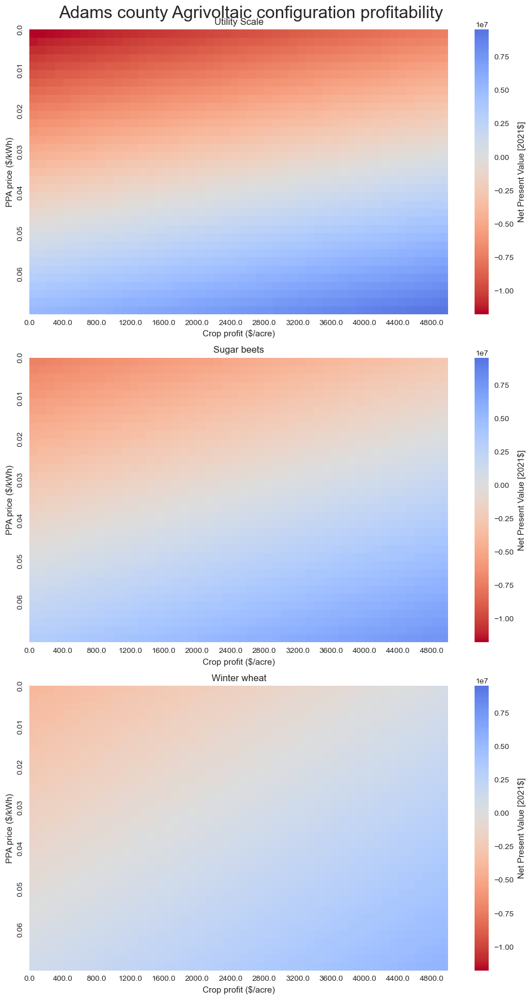

In [57]:
# Plot code courtesy of Heather Mirletz, see https://github.com/NREL/PV_ICE/commits/development/docs/tutorials/13%20-%20LifetimeVsRecycling%20Analysis%20-%20PLOS%20ONE.ipynb for original

values = np.unique(us_df.values.ravel())

plt.style.use("seaborn")

plt.rcParams['figure.figsize'] = (10, 18)
fig,ax = plt.subplots(3, 1)

xtics = range(0, 50, 4)
xlabels = us_df.columns.get_level_values(1)[0::4] / 100.0

ytics = range(0, 35, 5)
ylabels = us_df.index.values[0::5]

colormax = np.min(us_df.values).min()
colormin = np.max(us_df.values).max()

# Utility scale
plt.subplot(3,1,1)
sns.heatmap(us_df.values, annot = False, 
            cmap="coolwarm_r", #sns.diverging_palette(220, 20, n=200), 
            vmin= colormax,
            vmax= colormin,  
            center = 0.0 , #fix to be dynamic finding pvice value
            cbar_kws={'label': 'Net Present Value [2021$]'})
plt.title('Utility Scale')

plt.xlabel('Crop profit ($/acre)')
plt.ylabel('PPA price ($/kWh)')


plt.xticks(ticks=xtics, labels=xlabels, rotation=0)
plt.yticks(ticks=ytics, labels=ylabels)

# Sugar beets
plt.subplot(3,1,2)
sns.heatmap(sb_df.values, annot = False, 
            cmap='coolwarm_r', #sns.diverging_palette(220, 20, n=200), 
            vmin= colormax,
            vmax= colormin, 
            center = 0.0 , #fix to be dynamic finding pvice value
            cbar_kws={'label': 'Net Present Value [2021$]'})
plt.title('Sugar beets')

plt.xlabel('Crop profit ($/acre)')
plt.ylabel('PPA price ($/kWh)')


plt.xticks(ticks=xtics, labels=xlabels, rotation=0)
plt.yticks(ticks=ytics, labels=ylabels)

# Winter wheat
plt.subplot(3,1,3)
sns.heatmap(ww_df.values, annot = False, 
            cmap='coolwarm_r', #sns.diverging_palette(220, 20, n=200), 
            vmin= colormax,
            vmax= colormin, 
            center = 0.0 , #fix to be dynamic finding pvice value
            cbar_kws={'label': 'Net Present Value [2021$]'})
plt.title('Winter wheat')

plt.xlabel('Crop profit ($/acre)')
plt.ylabel('PPA price ($/kWh)')


plt.xticks(ticks=xtics, labels=xlabels, rotation=0)
plt.yticks(ticks=ytics, labels=ylabels)

fig.suptitle('Adams county Agrivoltaic configuration profitability', fontsize=22, x=0.45)
plt.subplots_adjust(top=0.9)
fig.tight_layout(h_pad=1)

plt.savefig('heatmap-npv-by-crop.png')
plt.show()
